1. CAM을 얻기 위한 기본모델의 구성과 학습이 정상 진행되었는가?
- ResNet50 + GAP + DenseLayer 결합된 CAM 모델의 학습과정이 안정적으로 수렴하였다.
2. 분류근거를 설명 가능한 Class activation map을 얻을 수 있는가?
- CAM 방식과 Grad-CAM 방식의 class activation map이 정상적으로 얻어지며, 시각화하였을 때 해당 object의 주요 특징 위치를 잘 반영한다.
3. 인식결과의 시각화 및 성능 분석을 적절히 수행하였는가?
- CAM과 Grad-CAM 각각에 대해 원본이미지합성, 바운딩박스, IoU 계산 과정을 통해 CAM과 Grad-CAM의 object localization 성능이 비교분석되었다.

## Import

In [7]:
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds

import copy
import cv2
from PIL import Image
import os

## 데이터셋 준비 및 확인

In [80]:
# 최초 수행시에는 다운로드가 진행됩니다. 오래 걸릴 수 있으니 유의해 주세요.
(ds_train, ds_test), ds_info = tfds.load(
    'stanford_dogs',
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

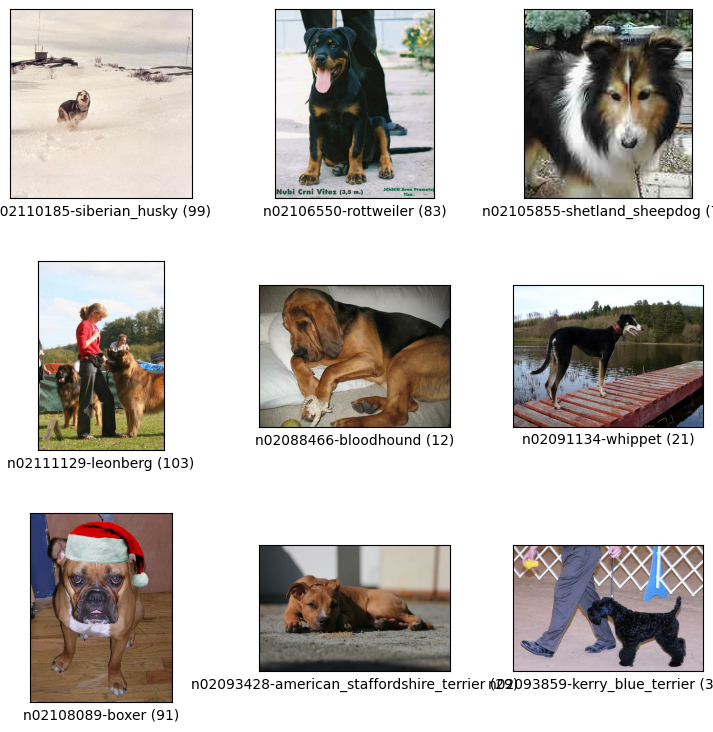

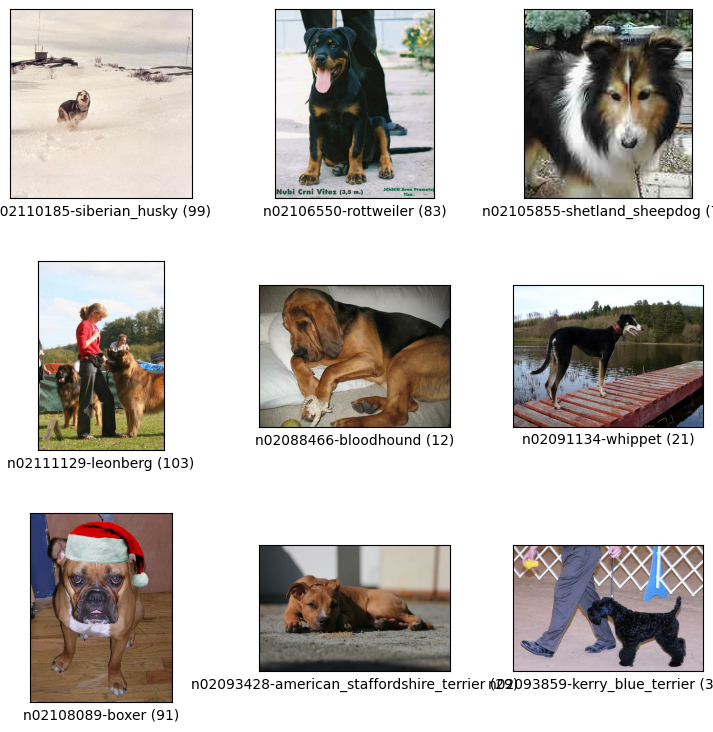

In [81]:
tfds.show_examples(ds_train, ds_info)

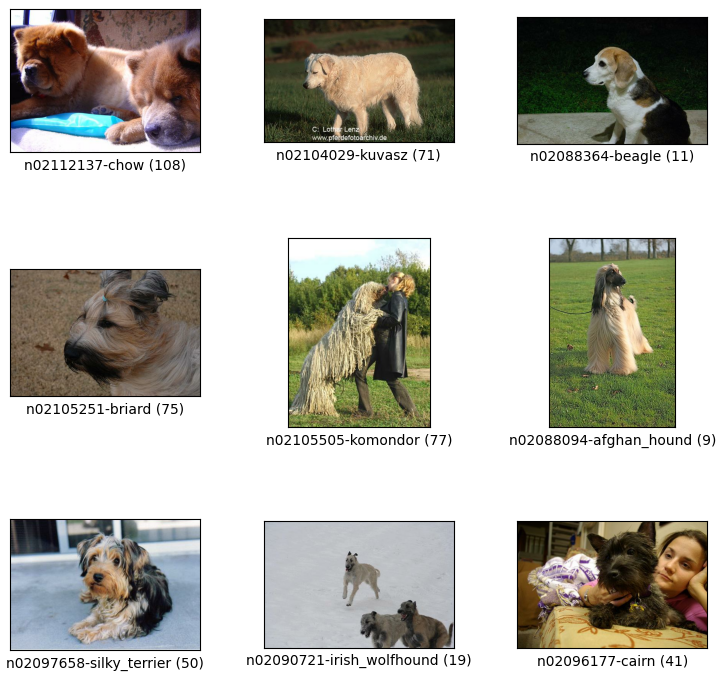

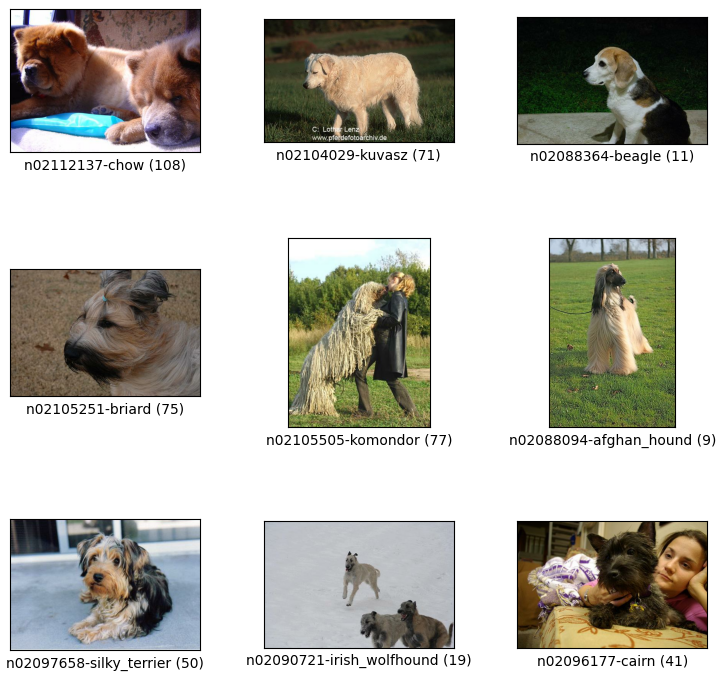

In [82]:
tfds.show_examples(ds_test, ds_info)

In [92]:
data_label_list = ds_info.features['label'].names

## 모델 준비

In [25]:
def normalize_and_resize_img(input):
    # Normalizes images: `uint8` -> `float32`
    image = tf.image.resize(input['image'], [224, 224])
    input['image'] = tf.cast(image, tf.float32) / 255.
    return input['image'], input['label']

def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img,
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size)
    '''
    if not is_test:
        ds = ds.repeat()
        ds = ds.shuffle(200)
    '''
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

## 메모리를 아끼기 위한 노력.. 학습은 한 번 만 하 자. . .

In [8]:
num_classes = ds_info.features["label"].num_classes

# 경로에 학습한 모델이 있으면 가져다가 쓰고 없으면 학습
cam_model_path = '/content/drive/MyDrive/Colab Notebooks/Q3_Class Activation Map/' # keras 확장자가 더 나은 저장 방법
file_name = 'cam_model1.keras'
full_model_path = os.path.join(cam_model_path, file_name)

if os.path.exists(full_model_path):
    # 모델 파일이 존재하는 경우, 모델을 로드
    cam_model = keras.models.load_model(full_model_path)
    print("모델 로드 완료")
else:
    # 새로운 모델을 생성
    base_model = keras.applications.resnet50.ResNet50(
        include_top=False,    # Imagenet 분류기 fully connected layer 제거
        weights='imagenet',
        input_shape=(224, 224, 3),
        pooling='avg',      # GAP 적용
    )
    x = base_model.output
    preds = keras.layers.Dense(num_classes, activation='softmax')(x)
    cam_model = keras.Model(inputs=base_model.input, outputs=preds)

    # 데이터셋에 전처리와 배치처리를 적용합니다.
    ds_train_norm = apply_normalize_on_dataset(ds_train)
    ds_val_norm = apply_normalize_on_dataset(ds_test)

    cam_model.compile(
        loss='sparse_categorical_crossentropy',
        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
        metrics=['accuracy'],
    )

    history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(ds_info.splits['train'].num_examples/16),
    validation_steps=int(ds_info.splits['test'].num_examples/16),
    epochs=5,
    validation_data=ds_val_norm,
    verbose=1,
    use_multiprocessing=True,
    )

    if not os.path.exists(cam_model_path):
        os.makedirs(cam_model_path)

    cam_model.save(cam_model_path + file_name)
    print("새 모델 학습 완료")

모델 로드 완료


In [7]:
cam_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

## CAM 구현하기

In [10]:
def get_one(ds):
    ds = ds.take(1)
    sample_data = list(ds.as_numpy_iterator())
    bbox = sample_data[0]['objects']['bbox']
    image = sample_data[0]['image']
    label = sample_data[0]['label']
    return sample_data[0]

67


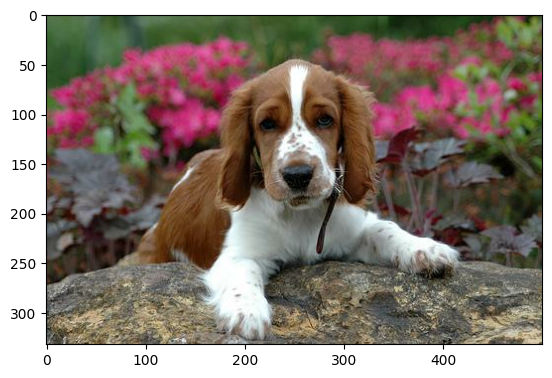

In [11]:
item = get_one(ds_test)
print(item['label'])
plt.imshow(item['image'])
plt.show()

In [12]:
def generate_cam(model, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]

    img_tensor, class_idx = normalize_and_resize_img(item)

    # 학습한 모델에서 원하는 Layer의 output을 얻기 위해서 모델의 input과 output을 새롭게 정의해줍니다.
    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])
    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor, 0))
    conv_outputs = conv_outputs[0, :, :, :]

    # 모델의 weight activation은 마지막 layer에 있습니다.
    class_weights = model.layers[-1].get_weights()[0]

    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2])
    for i, w in enumerate(class_weights[:, class_idx]):
        # conv_outputs의 i번째 채널과 i번째 weight를 곱해서 누적하면 활성화된 정도가 나타날 겁니다.
        cam_image += w * conv_outputs[:, :, i]

    cam_image /= np.max(cam_image) # activation score를 normalize합니다.
    cam_image = cam_image.numpy()
    cam_image = cv2.resize(cam_image, (width, height)) # 원래 이미지의 크기로 resize합니다.
    return cam_image

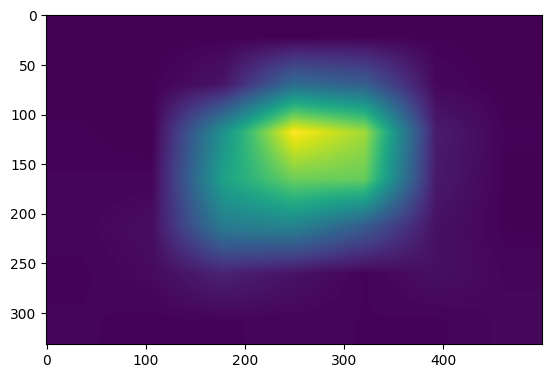

In [26]:
cam_image = generate_cam(cam_model, item)
plt.imshow(cam_image)

In [27]:
def visualize_cam_on_image(image, cam_image, alpha=0.5):
    beta = (1.0 - alpha)
    merged_image = cv2.addWeighted(image, alpha, cam_image, beta, 0.0)
    return merged_image

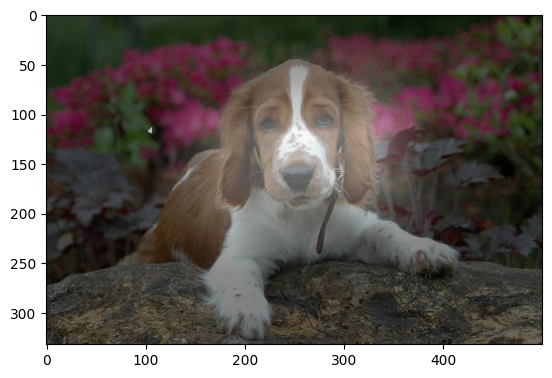

In [28]:
# visualize_cam_on_image() 함수 사용

type(item['image'])

origin_image = item['image'].astype(np.uint8)
cam_image_3channel = np.stack([cam_image*255]*3, axis=-1).astype(np.uint8)

blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)
plt.show()

## Grad-CAM 구현하기

In [29]:
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    img_tensor, class_idx = normalize_and_resize_img(item)

    # Grad cam에서도 cam과 같이 특정 레이어의 output을 필요로 하므로 모델의 input과 output을 새롭게 정의합니다.
    # 이때 원하는 레이어가 다를 수 있으니 해당 레이어의 이름으로 찾은 후 output으로 추가합니다.
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])

    # Gradient를 얻기 위해 tape를 사용합니다.
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))

        loss = pred[:, class_idx] # 원하는 class(여기서는 정답으로 활용) 예측값을 얻습니다.
        output = conv_output[0] # 원하는 layer의 output을 얻습니다.
        grad_val = tape.gradient(loss, conv_output)[0] # 예측값에 따른 Layer의 gradient를 얻습니다.

    weights = np.mean(grad_val, axis=(0, 1)) # gradient의 GAP으로 weight를 구합니다.
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        # output의 k번째 채널과 k번째 weight를 곱하고 누적해서 class activation map을 얻습니다.
        grad_cam_image += w * output[:, :, k]

    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))

    return grad_cam_image

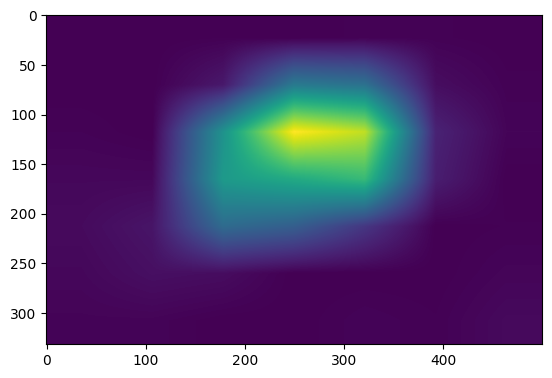

In [30]:
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item) # 출력에 가까운 레이어를 사용하는 것이 일반적인 것 같다.
plt.imshow(grad_cam_image)
plt.show()

## 바운딩 박스 구하기

In [156]:
def get_bbox(cam_image, score_thresh=0.075):
    low_indicies = cam_image <= score_thresh
    cam_image[low_indicies] = 0
    cam_image = (cam_image*255).astype(np.uint8)

    contours,_ = cv2.findContours(cam_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    rotated_rect = cv2.minAreaRect(cnt)
    rect = cv2.boxPoints(rotated_rect)
    rect = np.int0(rect)
    return rect

### cam 바운딩 박스

In [118]:
rect1 = get_bbox(cam_image)
rect1

array([[166, 197],
       [177,  74],
       [355,  90],
       [344, 213]])

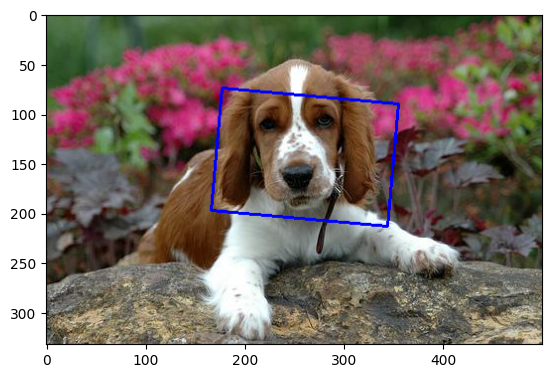

In [119]:
image = copy.deepcopy(item['image'])
image = cv2.drawContours(image, [rect1], 0, (0,0,255), 2)
plt.imshow(image)
plt.show()

### grad_cam 바운딩 박스

In [120]:
rect2 = get_bbox(grad_cam_image)
rect2

array([[ 81,  41],
       [423,  16],
       [439, 238],
       [ 97, 263]])

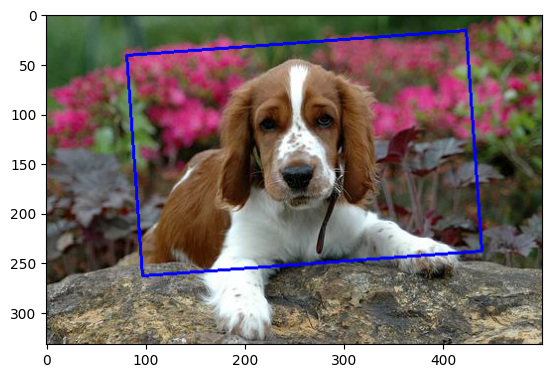

In [121]:
image = copy.deepcopy(item['image'])
image = cv2.drawContours(image, [rect2], 0, (0,0,255), 2)
plt.imshow(image)
plt.show()

## IoU 구하기

In [36]:
def rect_to_minmax(rect, image):
    bbox = [
        rect[:,1].min()/float(image.shape[0]),  #bounding box의 y_min
        rect[:,0].min()/float(image.shape[1]),  #bounding box의 x_min
        rect[:,1].max()/float(image.shape[0]), #bounding box의 y_max
        rect[:,0].max()/float(image.shape[1]) #bounding box의 x_max
    ]
    return bbox

In [122]:
pred_bbox_cam = rect_to_minmax(rect1, item['image'])
pred_bbox_cam

[0.22289156626506024, 0.332, 0.641566265060241, 0.71]

In [123]:
pred_bbox_grad_cam = rect_to_minmax(rect2, item['image'])
pred_bbox_grad_cam

[0.04819277108433735, 0.162, 0.7921686746987951, 0.878]

In [39]:
item['objects']['bbox']

array([[0.13554217, 0.146     , 0.9879518 , 0.826     ]], dtype=float32)

In [40]:
def get_iou(gt_bbox, pred_bbox):
    y_min = max(gt_bbox[0], pred_bbox[0])
    x_min= max(gt_bbox[1], pred_bbox[1])
    y_max = min(gt_bbox[2], pred_bbox[2])
    x_max = min(gt_bbox[3], pred_bbox[3])

    interArea = max(0, x_max - x_min) * max(0, y_max - y_min)
    boxAArea = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])
    boxBArea = (pred_bbox[2] - pred_bbox[0]) * (pred_bbox[3] - pred_bbox[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

In [124]:
get_iou(pred_bbox_cam, item['objects']['bbox'][0])

0.27303056132401093

In [125]:
get_iou(pred_bbox_grad_cam, item['objects']['bbox'][0])

0.6446601665539731

In [43]:
print(item['label'])

67


In [141]:
def get_bbox_iou():
  item = get_one(ds_test)
  print(item['label'])
  plt.imshow(item['image'])
  plt.show()

  cam_image = generate_cam(cam_model, item)
  plt.imshow(cam_image)

  type(item['image'])

  origin_image = item['image'].astype(np.uint8)
  cam_image_3channel = np.stack([cam_image*255]*3, axis=-1).astype(np.uint8)

  blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
  plt.imshow(blended_image)
  plt.show()

  grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item) # 출력에 가까운 레이어를 사용하는 것이 일반적인 것 같다.
  plt.imshow(grad_cam_image)
  plt.show()

  rect1 = get_bbox(cam_image)
  image = copy.deepcopy(item['image'])
  image = cv2.drawContours(image, [rect1], 0, (0,0,255), 2)
  plt.imshow(image)
  plt.show()

  rect2 = get_bbox(grad_cam_image)
  image = copy.deepcopy(item['image'])
  image = cv2.drawContours(image, [rect2], 0, (0,0,255), 2)
  plt.imshow(image)
  plt.show()


  pred_bbox_cam = rect_to_minmax(rect1, item['image'])

  pred_bbox_grad_cam = rect_to_minmax(rect2, item['image'])

  print(get_iou(pred_bbox_cam, item['objects']['bbox'][0]))

  print(get_iou(pred_bbox_grad_cam, item['objects']['bbox'][0]))

67


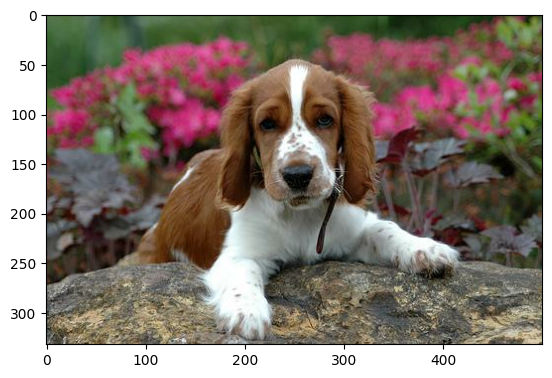

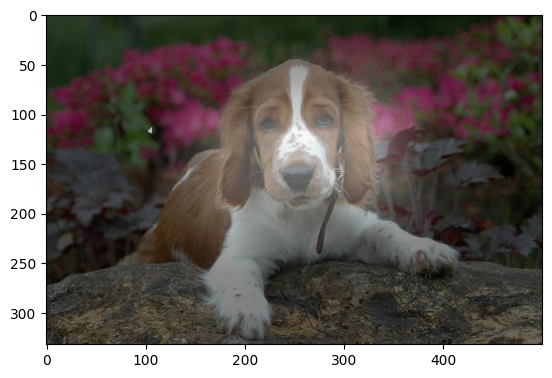

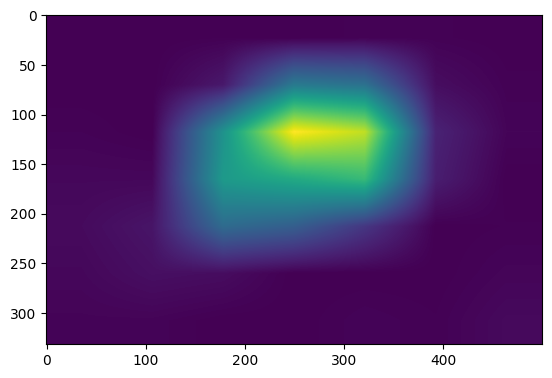

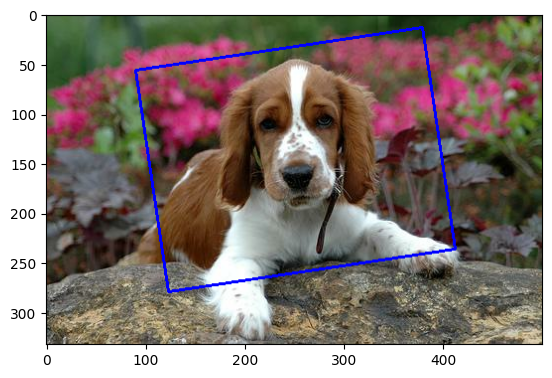

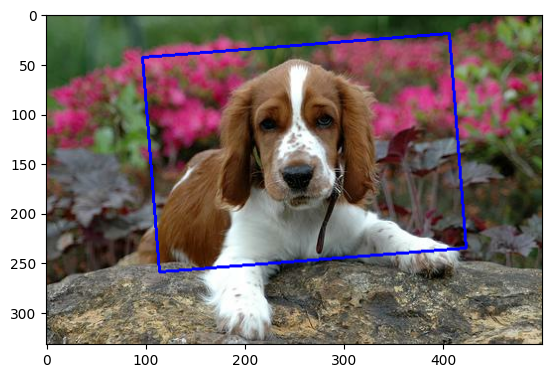

0.7073335725616006
0.6329701317047894


In [142]:
get_bbox_iou()

### 하나씩 랜덤으로 뽑는 경우 겹치는 사진이 많이 나오는 경우가 있어 겹치지 않게 뽑아서 수행

In [145]:
def get_list(ds, num = 5):
    sample_list = []

    ds = ds.take(num)
    sample_data = list(ds.as_numpy_iterator())
    bbox = sample_data[0]['objects']['bbox']
    image = sample_data[0]['image']
    label = sample_data[0]['label']

    for i in range(num):
        sample_list.append(sample_data[i])

    return sample_list

def get_bbox_iou_list():
    '''
    이 함수는 랜덤 샘플 데이터를 겹치지 않게 여러개 가져와서 cam iou boundingBox 를 출력해준다..
    '''

    item_list = get_list(ds_test, 5) # 갯수 지정 가능

    for item in item_list:

      print("Label Name: " + data_label_list[item['label']]+ str(item['label']))

      plt.figure(figsize=(20, 10))

      # 원본 이미지 출력
      plt.subplot(1, 3, 1)
      plt.imshow(item['image'])
      plt.title("Original Image")

      # CAM 이미지와 바운딩 박스
      cam_image = generate_cam(cam_model, item)
      plt.subplot(2, 3, 2)
      plt.imshow(cam_image)
      plt.title("CAM")

      rect1 = get_bbox(cam_image)
      image_cam = copy.deepcopy(item['image'])
      image_cam = cv2.drawContours(image_cam, [rect1], 0, (0,0,255), 2)
      plt.subplot(2, 3, 5)
      plt.imshow(image_cam)


      pred_bbox_cam = rect_to_minmax(rect1, item['image'])
      plt.imshow(image_cam)
      plt.title("CAM: " + str(get_iou(pred_bbox_cam, item['objects']['bbox'][0])))

      # Grad-CAM 이미지와 바운딩 박스
      grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)
      plt.subplot(2, 3, 3)
      plt.imshow(grad_cam_image)
      plt.title("Grad-CAM")

      rect2 = get_bbox(grad_cam_image)
      image_grad_cam = copy.deepcopy(item['image'])
      image_grad_cam = cv2.drawContours(image_grad_cam, [rect2], 0, (0,0,255), 2)
      plt.subplot(2, 3, 6)
      plt.imshow(image_grad_cam)

      pred_bbox_grad_cam = rect_to_minmax(rect2, item['image'])
      plt.imshow(image_grad_cam)
      plt.title("Grad-CAM: " + str(get_iou(pred_bbox_grad_cam, item['objects']['bbox'][0])))

      plt.show()
      print('-'* 250)

Label Name: n02112137-chow108


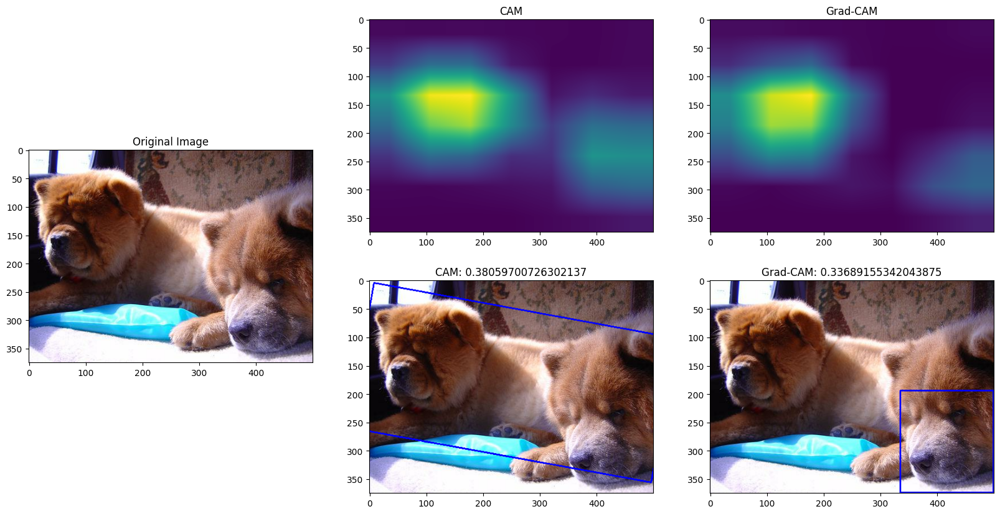

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Label Name: n02106030-collie80


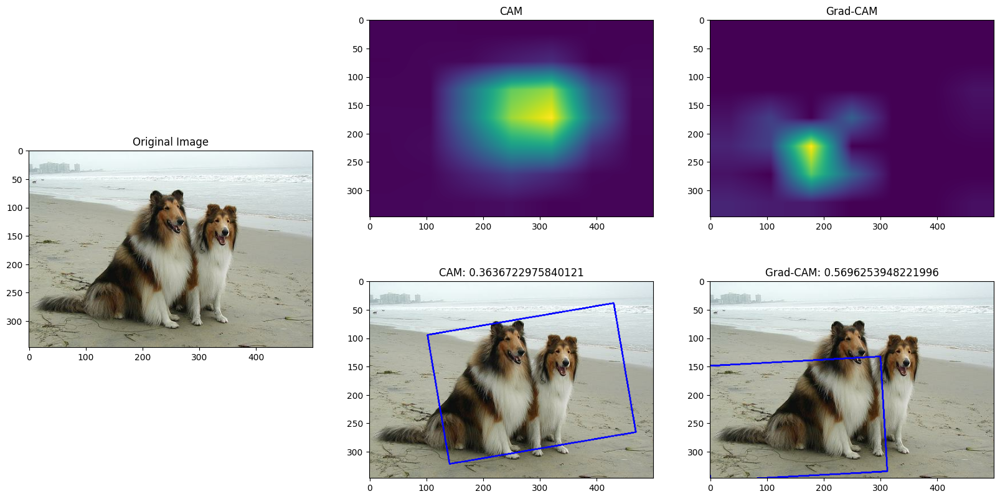

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Label Name: n02113978-mexican_hairless116


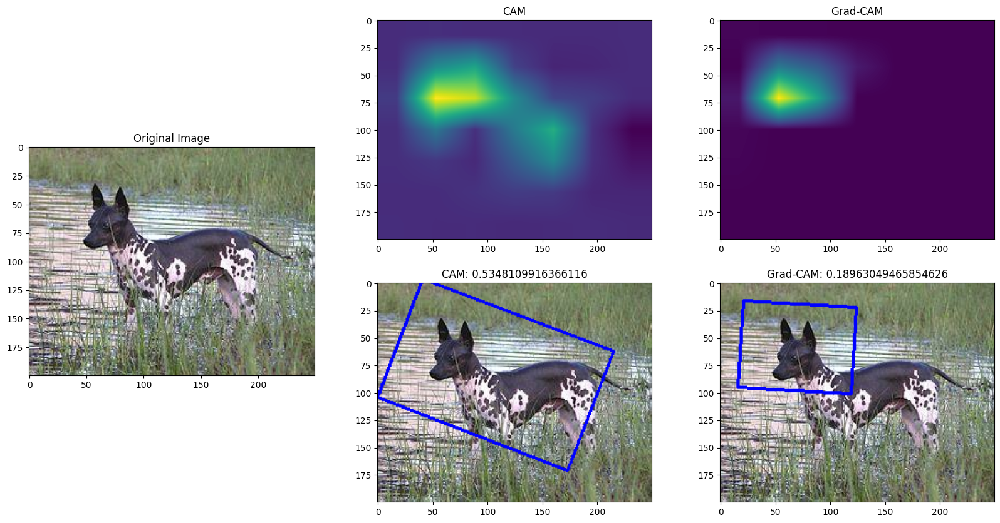

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Label Name: n02091467-norwegian_elkhound23


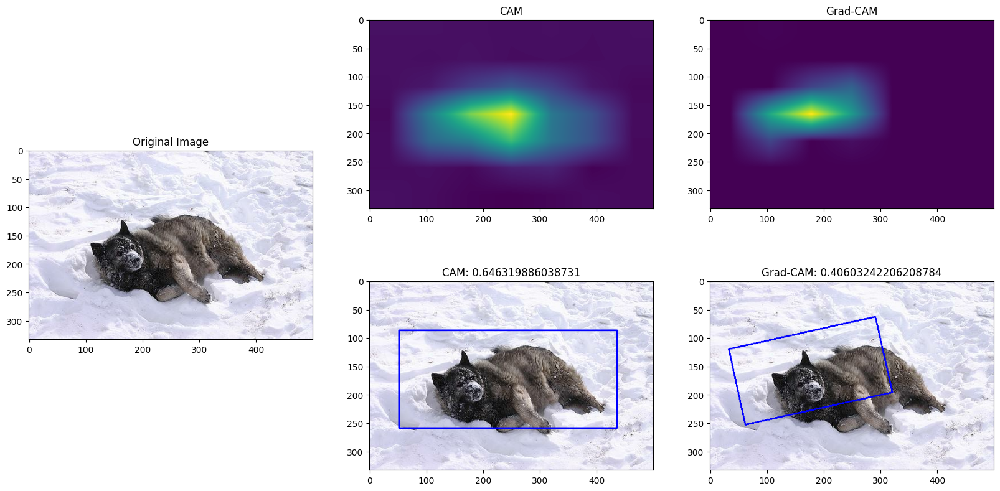

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Label Name: n02097130-giant_schnauzer46


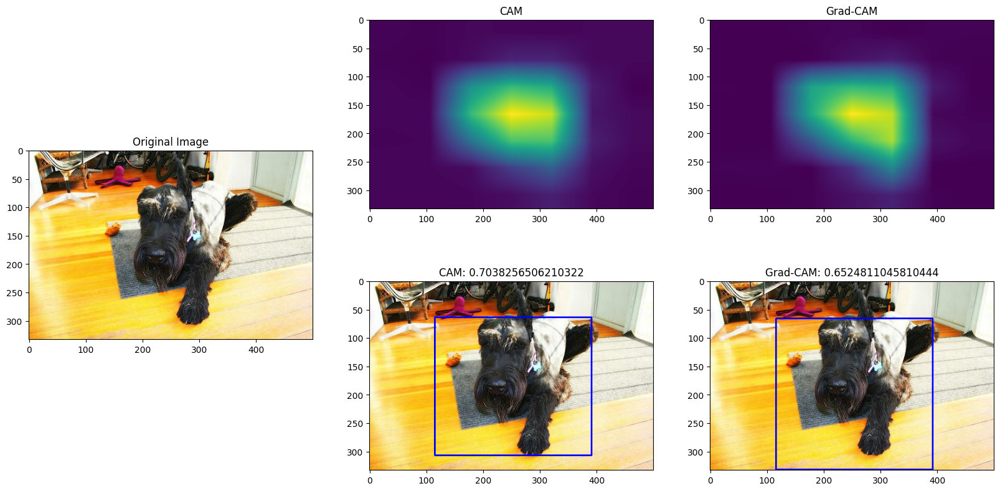

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [157]:
get_bbox_iou_list() # cam & iou 생성

## 추가실험 및 결과

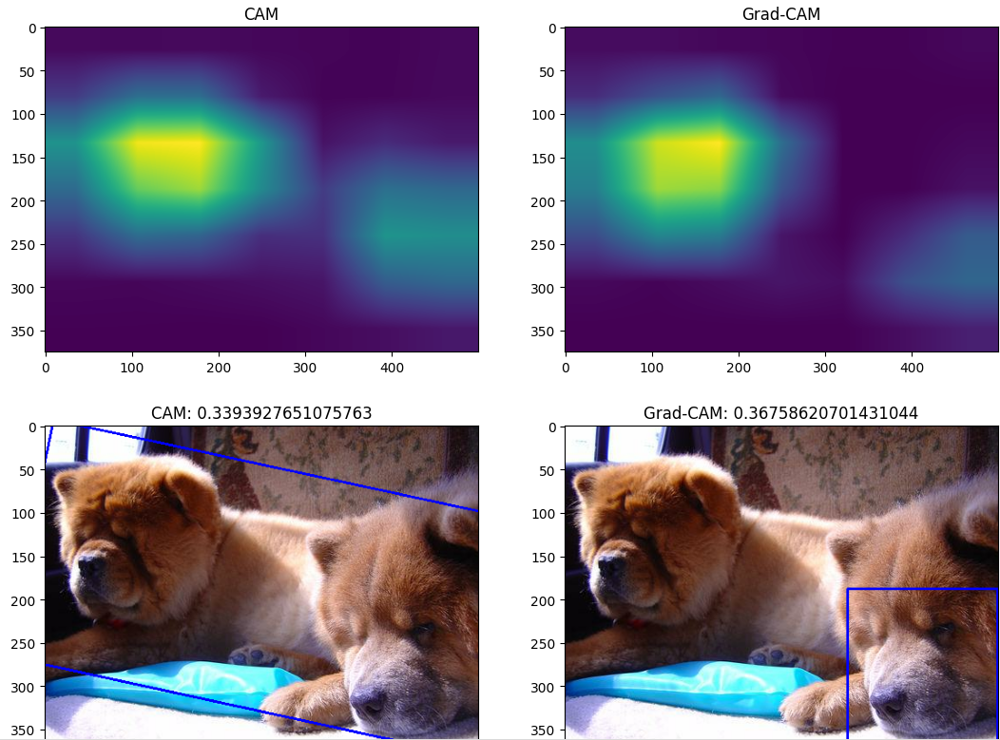

def get_bbox(cam_image, score_thresh=0.1):

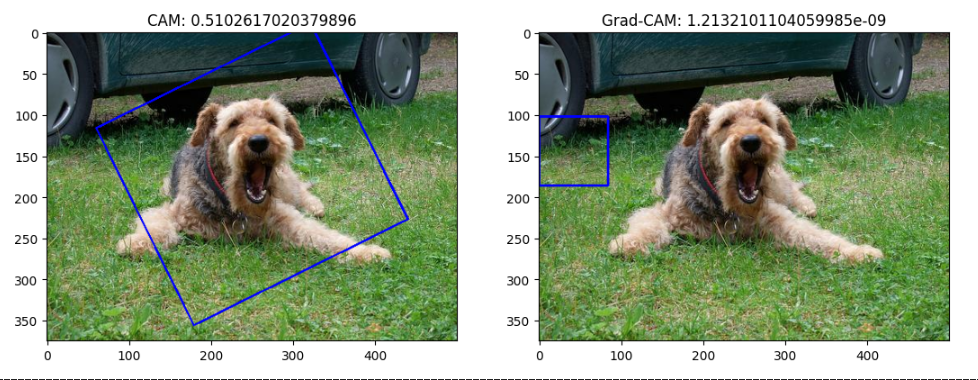

1. CAM과 Grad-CAM에 대해서 비교  

CAM과 Grad-CAM과 큰 차이는 없었지만 모델이 중요하다고 인식하는 부분에 대해서 조금 차이가 보이는 것을 알 수 있었고 Grad-CAM 부분에서 가끔 이상하게 인식하는 문제가 있었다.

2. Grad-CAM은 잘 나타나지만 바운딩 박스가 이상하게 나오는 현상
이 부분은 두가지 방법이 있는 것 같다.

- score_thresh값을 변경해서 인식 범위 변경

- contours,_ = cv2.findContours(cam_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) 이 부분에서 contours값이 경계선 리스트로 리턴되는데 이 부분에 여러개가 잡혀서 그 중에 잘못된 부분이 잡히는 것 같다. 리스트를 반복해서 iou가 가장 큰 값을 사용하는게 맞는 것 같다.

## 회고

이번 프로젝트를 진행하면서 모델이 특정 클래스를 결정하는 데 중요한 영역을 시각적으로 파악할 수 있었고다. 종종 확인하면서 진행해 보면 좋을 것 같다.

그리고 모델 기반에 따라서 CAM은 적용이 되는 모델이 있고 안되는 모델이 있는 것 같은데 다양한 모델에서 적용해보면서 확인해 봐야겠다.

중요한 점: 모델의 블랙 박스를 일정 부분 확인해 볼 수 있는 방법으로 중요한 것 같다.